# Setup

In [34]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [35]:
import warnings

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns # visualization library
import matplotlib.pyplot as plt # visualization library
from plotly.offline import init_notebook_mode, iplot # plotly offline mode
import plotly.graph_objs as go # plotly graphical object


import src.data.timeseries_eda as eda 

init_notebook_mode(connected=True)
# ignore filters
warnings.filterwarnings("ignore") # if there is a warning after some codes, this will avoid us to see them.
plt.style.use('ggplot')

# config

In [36]:
symbol = 'EURUSD'

# EDA

In [37]:
market_data = pd.read_csv(f'data/{symbol}_1h.csv')
market_data.head()

,Unnamed: 0,open_time,open_bid,low_bid,high_bid,close_bid,volume_bid,open_ask,low_ask,high_ask,close_ask,volume_ask,close_time,month,year
0,0,2015-02-02 01:00:00,1.13082,1.13082,1.13157,1.13153,2712.48,1.13086,1.13086,1.13160,1.13156,2853.70,2015-02-02 02:00:00,2,2015
1,1,2015-02-02 02:00:00,1.13152,1.13135,1.13255,1.13179,2935.13,1.13156,1.13136,1.13257,1.13181,2945.25,2015-02-02 03:00:00,2,2015
2,2,2015-02-02 03:00:00,1.13180,1.13054,1.13180,1.13102,2610.78,1.13181,1.13057,1.13185,1.13103,2617.55,2015-02-02 04:00:00,2,2015
3,3,2015-02-02 04:00:00,1.13101,1.13084,1.13132,1.13084,1723.14,1.13103,1.13088,1.13136,1.13088,1489.47,2015-02-02 05:00:00,2,2015
4,4,2015-02-02 05:00:00,1.13085,1.13071,1.13134,1.13084,1966.10,1.13088,1.13073,1.13136,1.13085,1753.40,2015-02-02 06:00:00,2,2015


In [38]:
market_data['open_time'] = pd.to_datetime(market_data['open_time'])
market_data.set_index('open_time', inplace=True)

market_data.drop(columns='close_time', inplace=True)

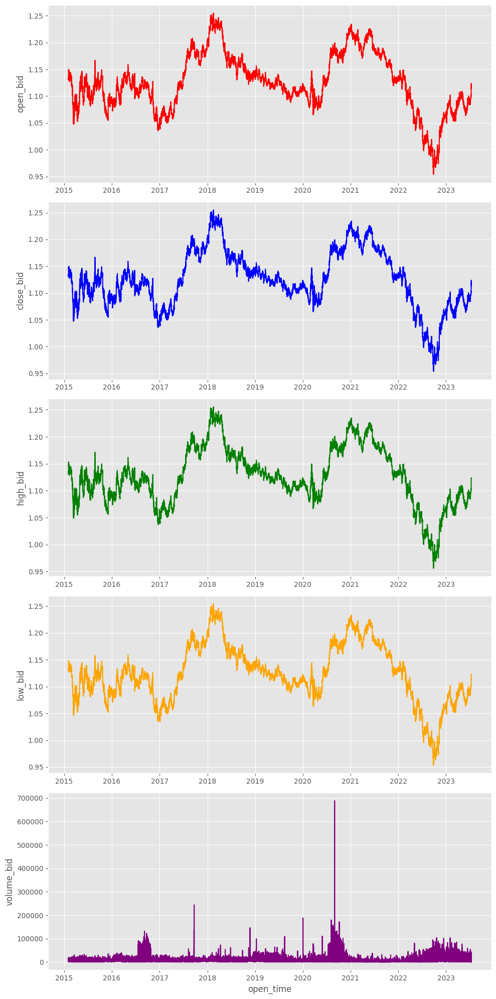

In [39]:
eda.plot_price_volume(market_data, kind = 'bid')

In [40]:
eda.plot_candlestick(market_data, kind = 'bid')

# Features Engineering

In [41]:
from src.data.feature_engineering import  TargetAdder,Scalar

target_adder = TargetAdder(step_number=1 , look_back_steps =2)
transformed = target_adder.transform(market_data)



In [42]:
normality_checker = eda.Normality(transformed.iloc[-2000:])

In [43]:
normality_checker.check('high_bid_change_rate_target')

False

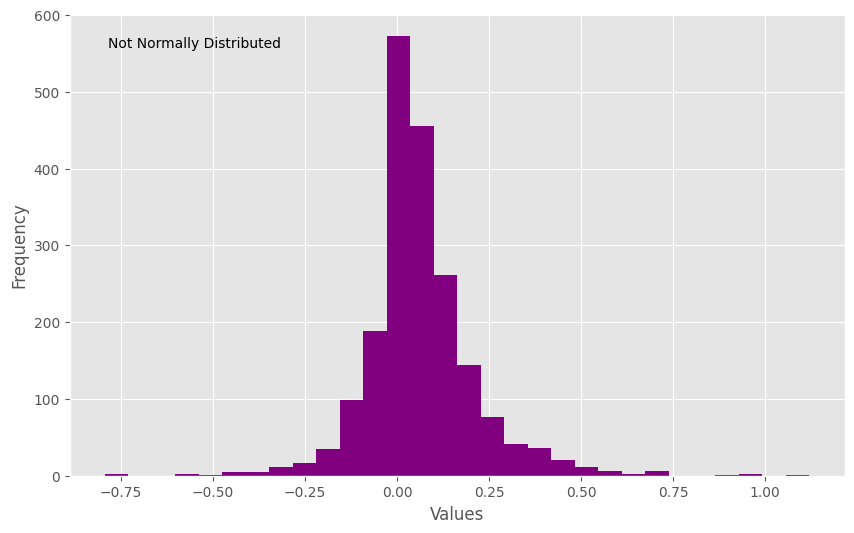

In [44]:
normality_checker.plot('high_bid_change_rate_target')

<Axes: >

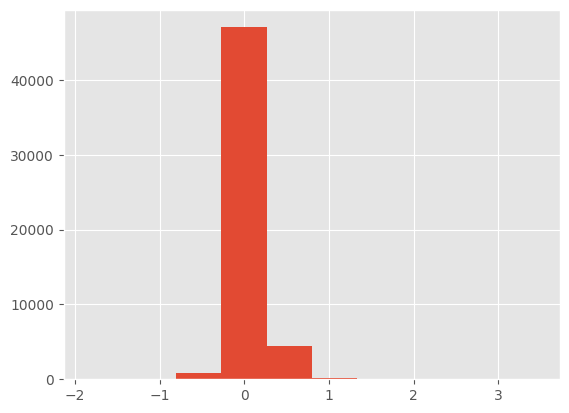

In [45]:
transformed['high_bid_change_rate_target'].hist()

In [46]:
# add retransform method to the target adder (goining from target to abs price) dobe 
# Scaler(Tranformer) , transform and retransform , scale a set of input features (fit, transform, retransform) done 
# Dataset class for your Pytorch model  
# train your model and try to refactor the training code to be re-usable
# evaluatin of models think about adding metrics and plots 
# move the Wavelet to the feature eng part and make it as a Tranformer: implementation done 
#    * denoise input data then make features 
#    * denoise the features directly 
# prepare in the evalutaion part a way to copmare the models performance 
# add the mlp auto-encoder denoiser and try to copmare results ( no-denoising vs wavelet vs auto-encoder) 

In [47]:
feature=['high_bid_change_rate_target']
target=['high_bid_change_rate_target'] #stationary!
transformed.columns

Index(['Unnamed: 0', 'open_bid', 'low_bid', 'high_bid', 'close_bid',
       'volume_bid', 'open_ask', 'low_ask', 'high_ask', 'close_ask',
       'volume_ask', 'month', 'year', 'high_bid_change_rate_target',
       'low_ask_change_rate_target', 'last_open_ask', 'last_open_bid'],
      dtype='object')

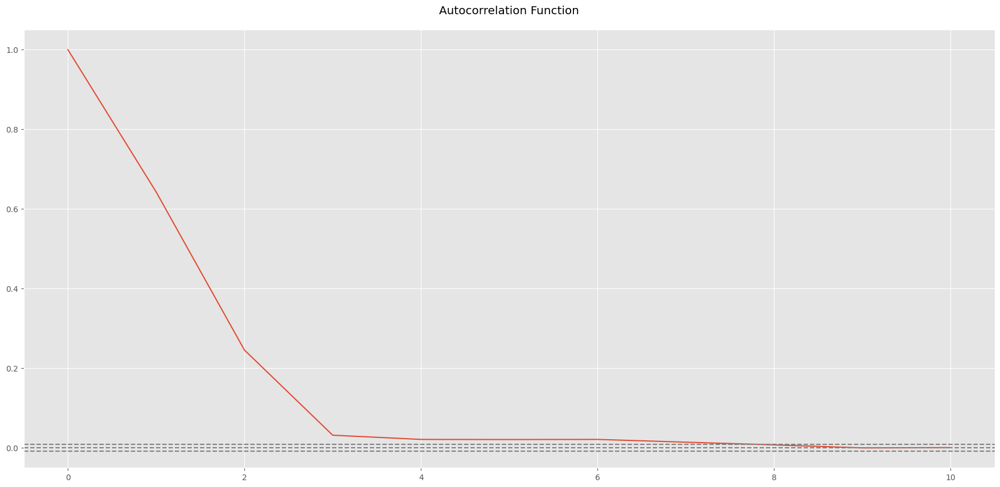

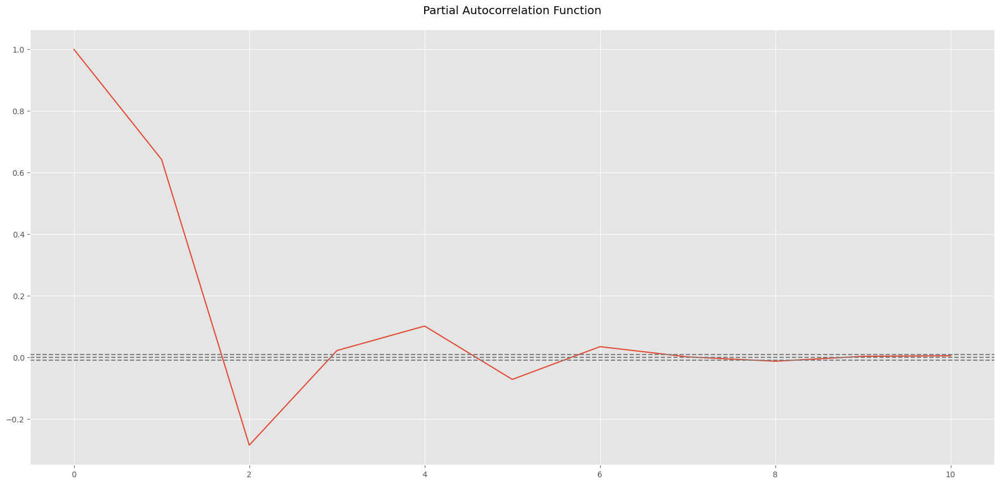

array([ 1.        ,  0.64232099, -0.28512301,  0.02204893,  0.10158562,
       -0.07171561,  0.0346538 ,  0.00151115, -0.012698  ,  0.00330084,
        0.00515228])

In [48]:
from src.data.timeseries_eda import RelationCheck

relation_checker = RelationCheck(transformed.dropna())
relation_checker.acf_plot(feature='high_bid_change_rate_target', nlags=10)
relation_checker.pacf_plot(feature='high_bid_change_rate_target', nlags=10, method="ols")

In [49]:
transformed

,Unnamed: 0,open_bid,low_bid,high_bid,close_bid,volume_bid,open_ask,low_ask,high_ask,close_ask,volume_ask,month,year,high_bid_change_rate_target,low_ask_change_rate_target,last_open_ask,last_open_bid
open_time,,,,,,,,,,,,,,,,,
2015-02-02 01:00:00,0,1.13082,1.13082,1.13157,1.13153,2712.48,1.13086,1.13086,1.13160,1.13156,2853.700,2,2015,NaN,NaN,NaN,NaN
2015-02-02 02:00:00,1,1.13152,1.13135,1.13255,1.13179,2935.13,1.13156,1.13136,1.13257,1.13181,2945.250,2,2015,NaN,NaN,NaN,NaN
2015-02-02 03:00:00,2,1.13180,1.13054,1.13180,1.13102,2610.78,1.13181,1.13057,1.13185,1.13103,2617.550,2,2015,0.083130,0.022106,1.13086,1.13082
2015-02-02 04:00:00,3,1.13101,1.13084,1.13132,1.13084,1723.14,1.13103,1.13088,1.13136,1.13088,1489.470,2,2015,-0.021207,0.056564,1.13156,1.13152
2015-02-02 05:00:00,4,1.13085,1.13071,1.13134,1.13084,1966.10,1.13088,1.13073,1.13136,1.13085,1753.400,2,2015,-0.041520,0.094542,1.13181,1.13180
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-14 00:00:00,52651,1.12244,1.12217,1.12280,1.12237,6880.17,1.12248,1.12220,1.12283,1.12241,4729.360,7,2023,0.036526,0.016038,1.12239,1.12238
2023-07-14 01:00:00,52652,1.12237,1.12134,1.12247,1.12229,16004.12,1.12240,1.12136,1.12249,1.12233,11233.430,7,2023,-0.002666,0.096222,1.12250,1.12244
2023-07-14 02:00:00,52653,1.12229,1.12221,1.12337,1.12336,19662.13,1.12232,1.12224,1.12341,1.12340,13221.189,7,2023,0.079290,0.017821,1.12248,1.12244


# Models Training

In [50]:

split_date = pd.to_datetime("2022-09-06 01:00:00")
split_index = transformed.index.get_loc(split_date)

train_data = transformed.iloc[:split_index]
test_data = transformed.iloc[split_index:]

test_data

,Unnamed: 0,open_bid,low_bid,high_bid,close_bid,volume_bid,open_ask,low_ask,high_ask,close_ask,volume_ask,month,year,high_bid_change_rate_target,low_ask_change_rate_target,last_open_ask,last_open_bid
open_time,,,,,,,,,,,,,,,,,
2022-09-06 01:00:00,47408,0.99682,0.99610,0.99706,0.99640,13540.9795,0.99689,0.99615,0.99710,0.99646,15082.290,9,2022,0.287669,-0.203193,0.99420,0.99413
2022-09-06 02:00:00,47409,0.99640,0.99491,0.99642,0.99585,13320.5400,0.99643,0.99497,0.99646,0.99591,15826.500,9,2022,0.136675,0.004020,0.99506,0.99501
2022-09-06 03:00:00,47410,0.99585,0.99426,0.99589,0.99440,9251.6400,0.99590,0.99430,0.99594,0.99444,12434.610,9,2022,-0.100311,0.252800,0.99689,0.99682
2022-09-06 04:00:00,47411,0.99440,0.99439,0.99548,0.99461,14885.6400,0.99446,0.99443,0.99551,0.99466,13270.470,9,2022,-0.095338,0.197711,0.99643,0.99640
2022-09-06 05:00:00,47412,0.99461,0.99445,0.99649,0.99590,22043.0600,0.99467,0.99451,0.99653,0.99597,16775.300,9,2022,0.059246,0.134562,0.99590,0.99585
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-14 00:00:00,52651,1.12244,1.12217,1.12280,1.12237,6880.1700,1.12248,1.12220,1.12283,1.12241,4729.360,7,2023,0.036526,0.016038,1.12239,1.12238
2023-07-14 01:00:00,52652,1.12237,1.12134,1.12247,1.12229,16004.1200,1.12240,1.12136,1.12249,1.12233,11233.430,7,2023,-0.002666,0.096222,1.12250,1.12244
2023-07-14 02:00:00,52653,1.12229,1.12221,1.12337,1.12336,19662.1300,1.12232,1.12224,1.12341,1.12340,13221.189,7,2023,0.079290,0.017821,1.12248,1.12244


In [51]:
import torch
import torch.nn as nn
import torch.optim as optim

class ARIMA(nn.Module):
    def __init__(self, p, d, q):
        super(ARIMA, self).__init__()
        self.p = p  
        self.d = d  
        self.q = q  
        self.ar_coefficients = nn.Parameter(torch.randn(self.p))
        self.ma_coefficients = nn.Parameter(torch.randn(self.q))
        self.mean = nn.Parameter(torch.tensor(0.0))

    def forward(self, x):
        for i in range(self.d):
            x = x - torch.roll(x, shifts=1)
            x[0] = 0.0
        indexes=x.index.to_numpy()    
        x = torch.tensor(x.values, dtype=torch.float32)
        ar_component = torch.zeros_like(x)
        ma_component = torch.zeros_like(x)
        for t in range(self.p, x.size(0)):
            ar_component[t] = torch.dot(x[t-self.p:t], self.ar_coefficients)
        for t in range(self.q, x.size(0)):
            ma_component[t] = torch.dot(x[t-self.q:t], self.ma_coefficients)

        
        y = ar_component + ma_component + self.mean
        return indexes,y
    
    def compute_aic(self, data):
        _,y = self.forward(data)
        data = torch.tensor(data.values, dtype=torch.float32)
        valid_indices = torch.logical_not(torch.logical_or(torch.isnan(data), torch.isnan(y)))
        data_valid = data[valid_indices]
        
        y_valid = y[valid_indices]
        residuals = data_valid - y_valid
        likelihood = torch.exp(-0.5 * torch.mean(residuals**2)) 

        k = self.p + self.q + 1
        n = len(data)
        aic = 2 * k - 2 * np.log(likelihood.detach().numpy())
        return aic


In [52]:
model = ARIMA(2,0,2)
x=transformed[target].squeeze()    
aic = model.compute_aic(x)
aic




10.481417953968048

In [53]:
aic

10.481417953968048

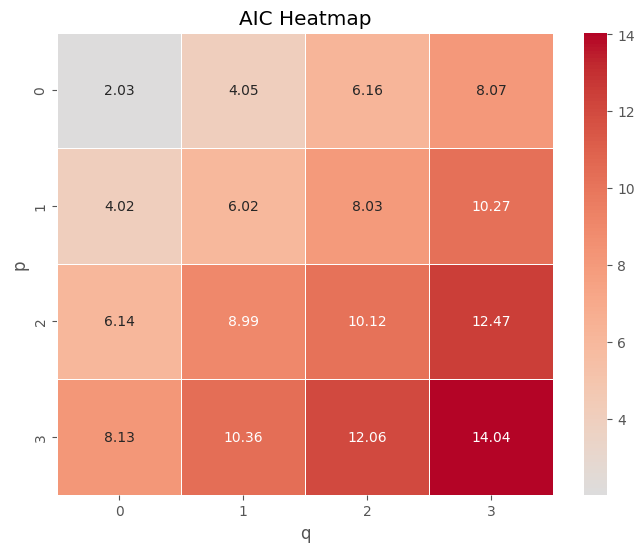

In [54]:

p_values = range(4)  # [:4]
q_values = range(4)  


aic_matrix = np.zeros((len(p_values), len(q_values)))

for i, p in enumerate(p_values):
    for j, q in enumerate(q_values):
        try:
            model = ARIMA(p,0,q)
            
            aic= model.compute_aic(transformed[target].squeeze())
            
            aic_matrix[i, j] = aic
        except:
            continue


plt.figure(figsize=(8, 6))
sns.heatmap(aic_matrix, annot=True, fmt='.2f', cmap='coolwarm', center=np.min(aic_matrix), linewidths=0.5,
            xticklabels=q_values, yticklabels=p_values)
plt.xlabel('q')
plt.ylabel('p')
plt.title('AIC Heatmap')
plt.show()

In [55]:
test_data

,Unnamed: 0,open_bid,low_bid,high_bid,close_bid,volume_bid,open_ask,low_ask,high_ask,close_ask,volume_ask,month,year,high_bid_change_rate_target,low_ask_change_rate_target,last_open_ask,last_open_bid
open_time,,,,,,,,,,,,,,,,,
2022-09-06 01:00:00,47408,0.99682,0.99610,0.99706,0.99640,13540.9795,0.99689,0.99615,0.99710,0.99646,15082.290,9,2022,0.287669,-0.203193,0.99420,0.99413
2022-09-06 02:00:00,47409,0.99640,0.99491,0.99642,0.99585,13320.5400,0.99643,0.99497,0.99646,0.99591,15826.500,9,2022,0.136675,0.004020,0.99506,0.99501
2022-09-06 03:00:00,47410,0.99585,0.99426,0.99589,0.99440,9251.6400,0.99590,0.99430,0.99594,0.99444,12434.610,9,2022,-0.100311,0.252800,0.99689,0.99682
2022-09-06 04:00:00,47411,0.99440,0.99439,0.99548,0.99461,14885.6400,0.99446,0.99443,0.99551,0.99466,13270.470,9,2022,-0.095338,0.197711,0.99643,0.99640
2022-09-06 05:00:00,47412,0.99461,0.99445,0.99649,0.99590,22043.0600,0.99467,0.99451,0.99653,0.99597,16775.300,9,2022,0.059246,0.134562,0.99590,0.99585
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-14 00:00:00,52651,1.12244,1.12217,1.12280,1.12237,6880.1700,1.12248,1.12220,1.12283,1.12241,4729.360,7,2023,0.036526,0.016038,1.12239,1.12238
2023-07-14 01:00:00,52652,1.12237,1.12134,1.12247,1.12229,16004.1200,1.12240,1.12136,1.12249,1.12233,11233.430,7,2023,-0.002666,0.096222,1.12250,1.12244
2023-07-14 02:00:00,52653,1.12229,1.12221,1.12337,1.12336,19662.1300,1.12232,1.12224,1.12341,1.12340,13221.189,7,2023,0.079290,0.017821,1.12248,1.12244


In [56]:
target=['high_bid_change_rate_target']
model = ARIMA(2,0,2)
indexes,high_bid_predictions = model.forward(test_data[target].squeeze())
target=['low_ask_change_rate_target']
indexes,low_ask_predictions = model.forward(test_data[target].squeeze())


# Evaluation

In [57]:
from src.eval.metrics import ForecastEval

In [58]:
predictions = pd.DataFrame(
    data = {
        'high_bid_change_rate_target': high_bid_predictions.detach().numpy(),
        'low_ask_change_rate_target': low_ask_predictions.detach().numpy(),
    },
    index = indexes
)   
predictions[['last_open_ask','last_open_bid']] = test_data[['last_open_ask','last_open_bid']]
predictions.head()

,high_bid_change_rate_target,low_ask_change_rate_target,last_open_ask,last_open_bid
2022-09-06 01:00:00,0.000000,0.000000,0.99420,0.99413
2022-09-06 02:00:00,0.000000,0.000000,0.99506,0.99501
2022-09-06 03:00:00,0.033710,-0.144295,0.99689,0.99682
2022-09-06 04:00:00,0.214005,-0.300131,0.99643,0.99640
2022-09-06 05:00:00,0.045372,-0.063355,0.99590,0.99585


In [59]:
predictions = target_adder.retransform(predictions)

In [67]:
orginal_test_data = market_data[['open_ask','open_bid','low_ask','high_bid','close_bid','close_ask']].loc[predictions.index]

<Axes: >

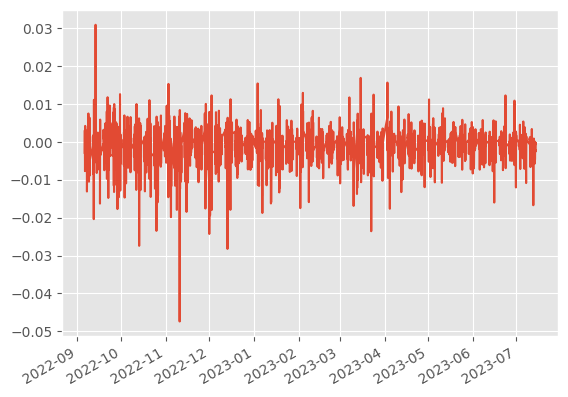

In [68]:
(predictions['high_bid'] - orginal_test_data['high_bid']).plot()

Position Accuracy: 0.82%
ABS error:  55848.55788500176


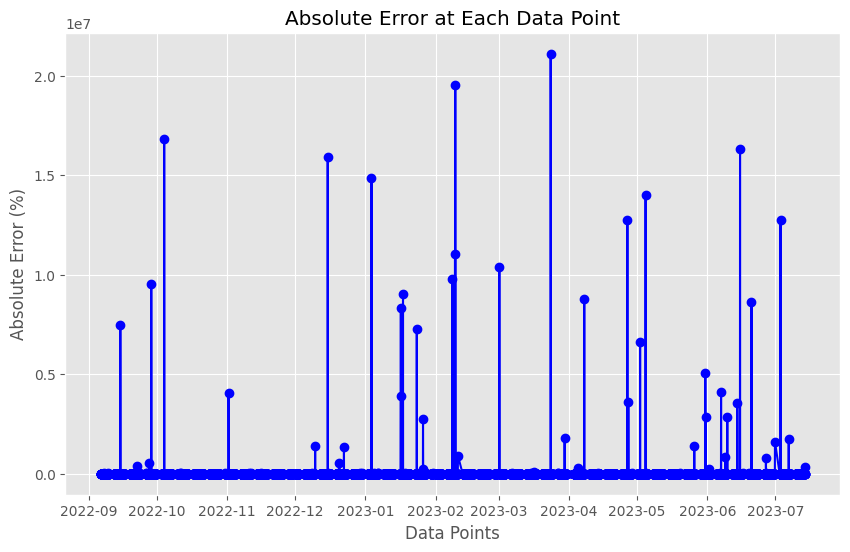

In [69]:
evaluator= ForecastEval(orginal_data= orginal_test_data , predicted_data = predictions)
evaluator.run_evaluation()

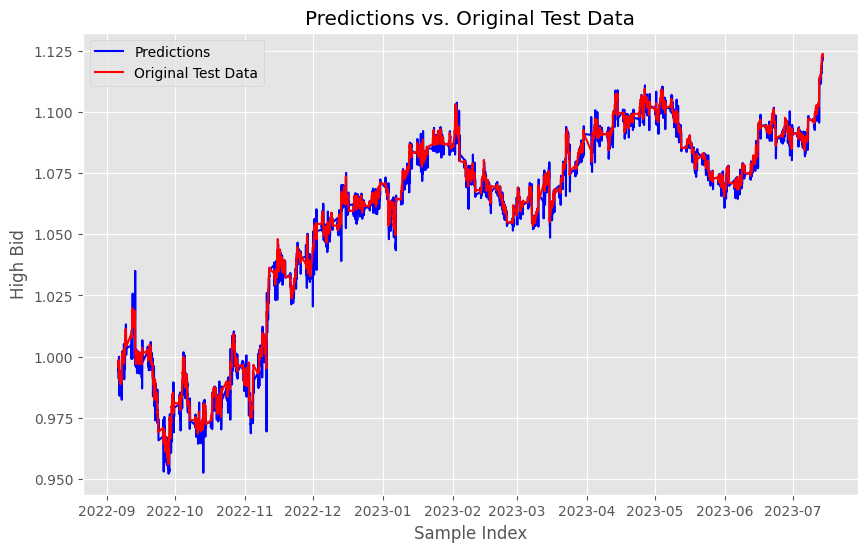

In [70]:
plt.figure(figsize=(10, 6))
plt.plot(predictions.index, predictions['high_bid'], label='Predictions', color='blue')
plt.plot(orginal_test_data.index, orginal_test_data['high_bid'], label='Original Test Data', color='red')
plt.xlabel('Sample Index')
plt.ylabel('High Bid')
plt.legend()
plt.title('Predictions vs. Original Test Data')
plt.grid(True)
plt.show()

In [71]:
(orginal_test_data['high_bid']>predictions['high_bid']).mean()*100

66.9016768292683

In [72]:
(orginal_test_data['low_ask']>predictions['low_ask']).mean()*100

36.337652439024396

In [73]:
orginal_test_data.to_csv('data/predictions/original_test_data_arima_baseline.csv')
predictions.to_csv('data/predictions/predictions_arima_baseline.csv')
